In [1]:
import imblearn
import pandas as pd
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, accuracy_score, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import tree
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv("contributors2.csv")
df
selected_columns = ['name_with_owner','is_core', 'issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

pred_cols = ['issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

# Subset the DataFrame based on the selected columns
c2 = df[selected_columns].copy()
#get projects not in cluster
c2_cols = ['microsoft/azuredatastudio', 'xamarin/xamarin-macios', 'pingcap/docs']
#combine into one list
c2 = c2[c2['name_with_owner'].isin(c2_cols)]
c2 = c2.drop(columns = 'name_with_owner')
c2

,is_core,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr
15,0,0,5,38,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,1.458
42,0,0,1,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.023
116,0,0,1,12,0,0,0,1,0,0,0,0.000,0.000,0.000,0.000,0.000,0.016
142,0,6,445,2491,280,3,15,15,7,1,1,0.013,6.367,14.174,14.572,1.308,7.672
199,0,0,4,20,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7329,0,0,1,4,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,5.728
7330,0,0,1,14,0,0,0,1,0,0,0,0.000,0.000,0.000,0.000,0.000,20.243
7331,0,0,1,4,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,5.449
7332,0,0,1,11,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.077


In [3]:
X = c2.drop(columns = 'is_core')
y = c2['is_core']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [4]:
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

In [5]:
train_df

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
5759,0,3,43,0,0,1,5,0,0,1,0.293,0.0,0.266,0.000,0.000,12.374,0
6084,0,2,15,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,7.779,0
6121,0,5,57,0,0,0,0,0,0,0,0.000,0.0,0.000,0.000,0.000,21.787,0
4173,0,4,9,2,0,0,0,0,0,0,0.000,0.0,0.000,11.117,0.000,3.260,0
4738,0,7,13,6,0,0,0,0,0,0,0.000,0.0,0.000,0.452,0.000,0.625,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5812,1,4,33,0,3,1,0,0,0,0,0.000,0.0,245.625,0.000,1.303,11.469,0
1048,0,1,1,1,0,0,0,0,0,0,0.000,0.0,0.000,88.242,0.000,4.412,0
6014,1,254,414,80,1,7,1,0,0,0,0.000,0.0,1932.041,49.370,89.753,2.373,1
4553,3,1,1,1,14,0,0,0,6,2,8253.997,0.0,0.000,0.827,1250.243,0.194,0


In [6]:
adasyn = imblearn.over_sampling.ADASYN(random_state = 0)
x_resampled_adasyn, y_resampled_adasyn = adasyn.fit_resample(X_train, y_train)
c2_train = pd.DataFrame(data=x_resampled_adasyn, columns=pred_cols)
c2_train['is_core'] = y_resampled_adasyn  # Assuming 'target' is the name of your target column
c2_train

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0,3,43,0,0,1,5,0,0,1,0.293000,0.000000,0.266000,0.000000,0.000000,12.374000,0
1,0,2,15,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,7.779000,0
2,0,5,57,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,21.787000,0
3,0,4,9,2,0,0,0,0,0,0,0.000000,0.000000,0.000000,11.117000,0.000000,3.260000,0
4,0,7,13,6,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.452000,0.000000,0.625000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,66,281,394,87,83,103,1,0,2,0,0.386312,0.009574,1775.035540,40.241247,85.814849,2.465848,1
874,87,427,575,69,63,113,9,1,3,0,0.000000,1.741405,1984.554353,70.505919,84.314112,2.109554,1
875,3,246,402,77,4,7,1,0,0,0,0.000000,0.637316,1964.548067,48.356742,90.649871,2.442049,1
876,215,682,812,54,154,270,21,3,9,0,0.000000,4.294472,2061.543985,101.493211,76.340178,1.723316,1


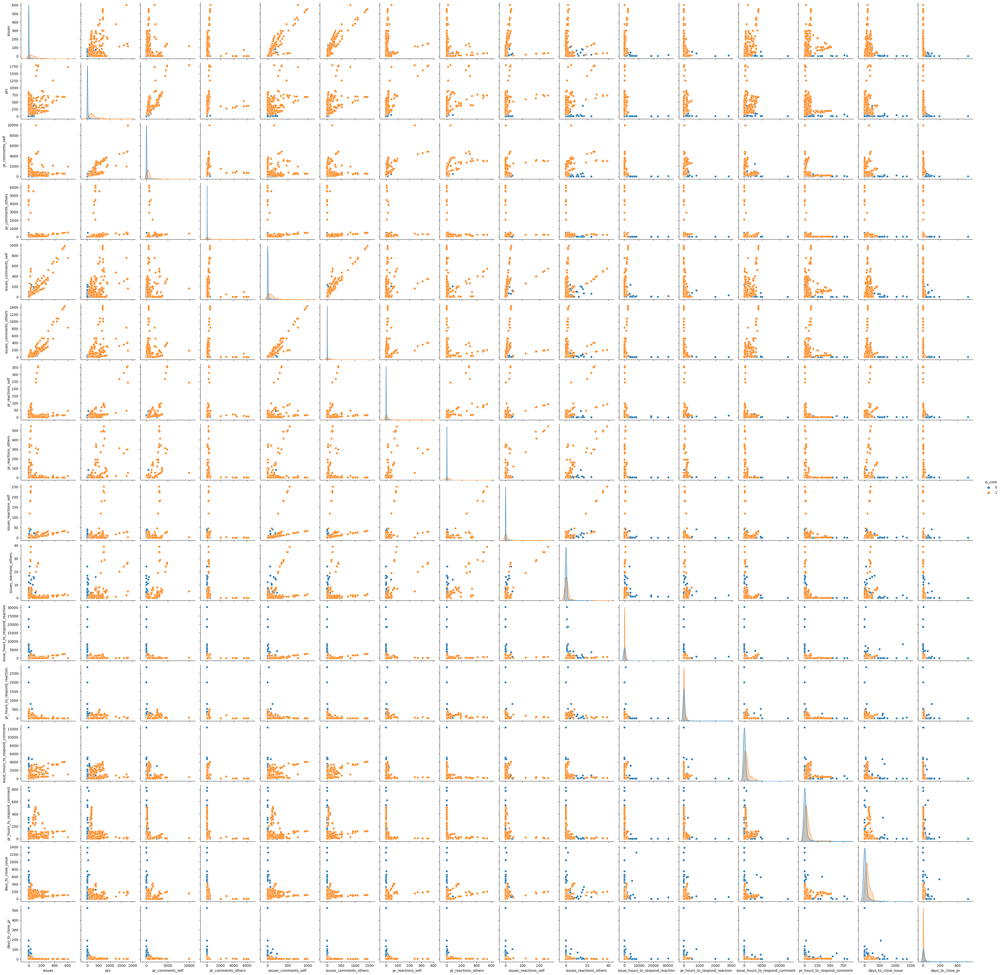

In [7]:
sns.pairplot(c2_train, hue = 'is_core')

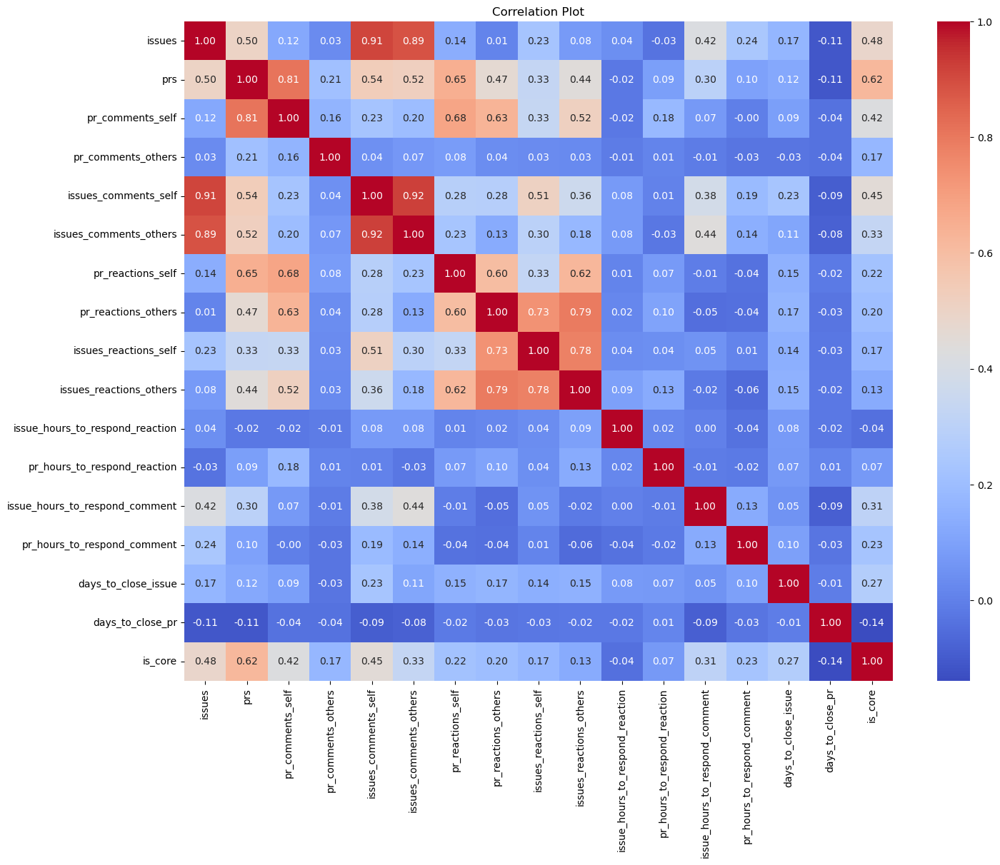

In [8]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(c2_train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [9]:
X = c2_train.drop('is_core', axis=1)
y = c2_train['is_core']

# Calculating mutual information for each feature
mi_scores = mutual_info_classif(X, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.3451
prs: 0.6044
pr_comments_self: 0.5360
pr_comments_others: 0.4703
issues_comments_self: 0.3174
issues_comments_others: 0.4295
pr_reactions_self: 0.2327
pr_reactions_others: 0.1808
issues_reactions_self: 0.1572
issues_reactions_others: 0.0686
issue_hours_to_respond_reaction: 0.1797
pr_hours_to_respond_reaction: 0.3176
issue_hours_to_respond_comment: 0.3860
pr_hours_to_respond_comment: 0.3649
days_to_close_issue: 0.3136
days_to_close_pr: 0.1367


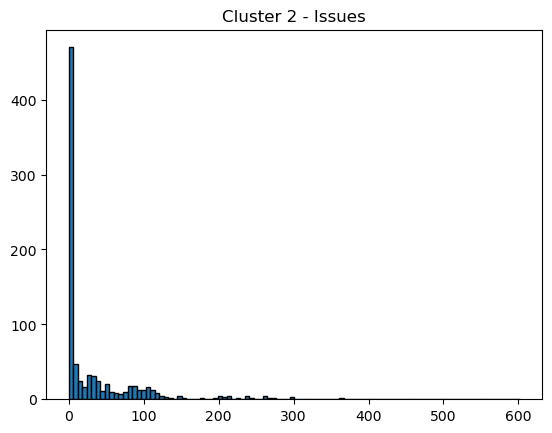

In [10]:
plt.hist(c2_train.issues, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues')
plt.show()

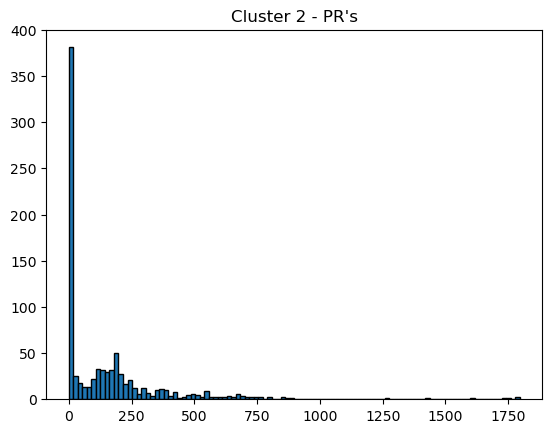

In [11]:
plt.hist(c2_train.prs, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s')
plt.show()

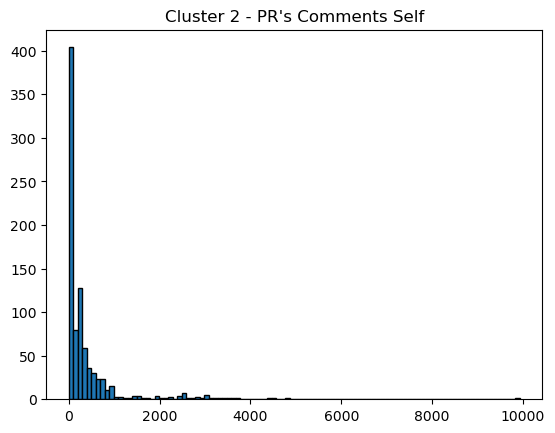

In [12]:
plt.hist(c2_train.pr_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s Comments Self')
plt.show()

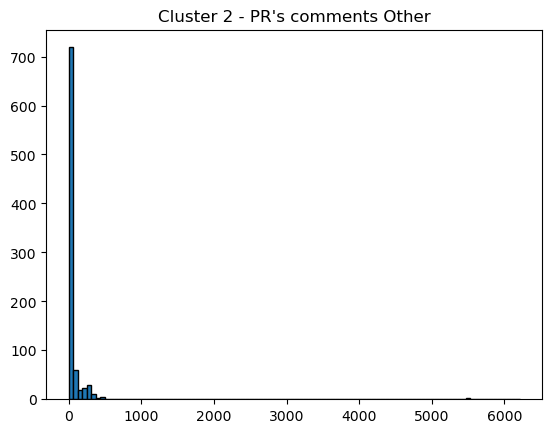

In [13]:
plt.hist(c2_train.pr_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s comments Other')
plt.show()

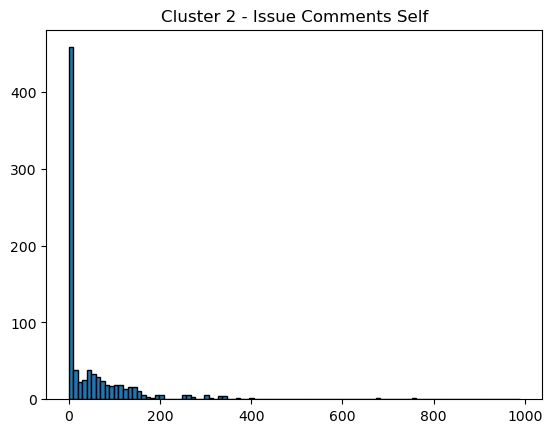

In [14]:
plt.hist(c2_train.issues_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issue Comments Self')
plt.show()

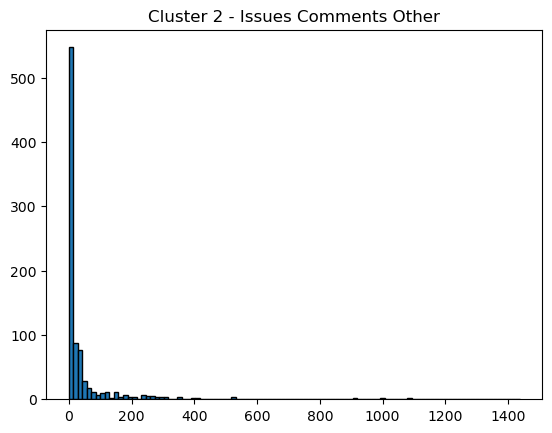

In [15]:
plt.hist(c2_train.issues_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues Comments Other')
plt.show()

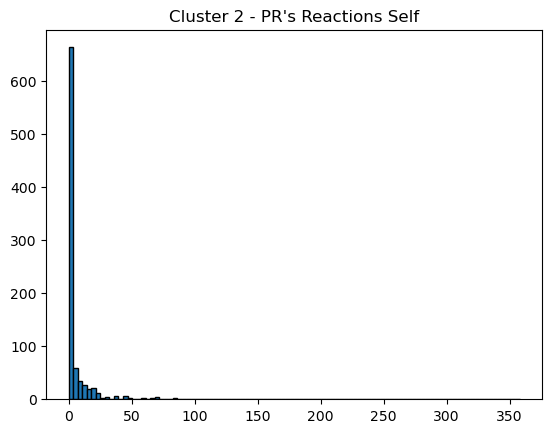

In [16]:
plt.hist(c2_train.pr_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s Reactions Self')
plt.show()

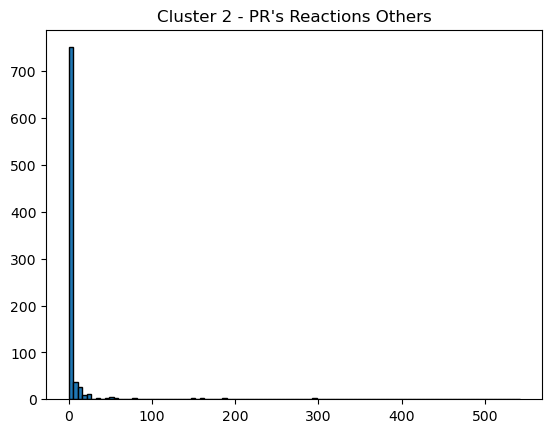

In [17]:
plt.hist(c2_train.pr_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s Reactions Others')
plt.show()

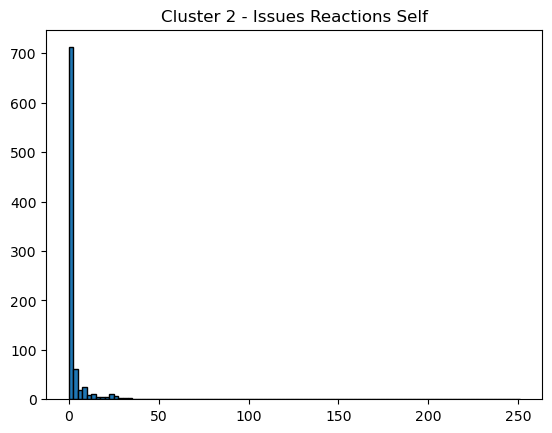

In [18]:
plt.hist(c2_train.issues_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues Reactions Self')
plt.show()

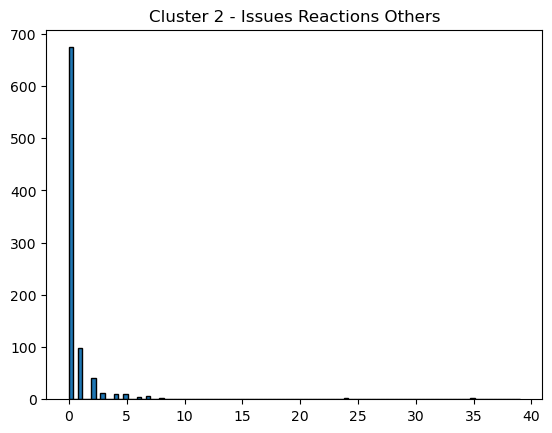

In [19]:
plt.hist(c2_train.issues_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues Reactions Others')
plt.show()

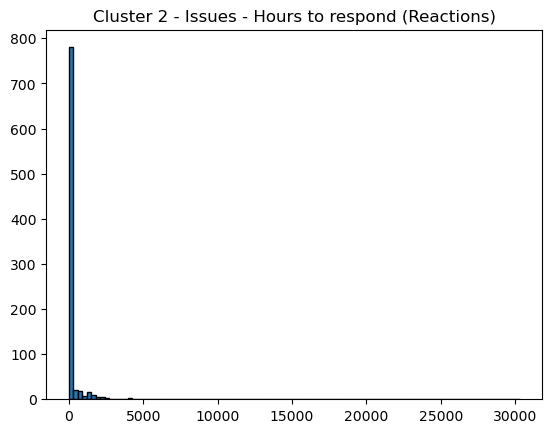

In [20]:
plt.hist(c2_train.issue_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues - Hours to respond (Reactions)')
plt.show()

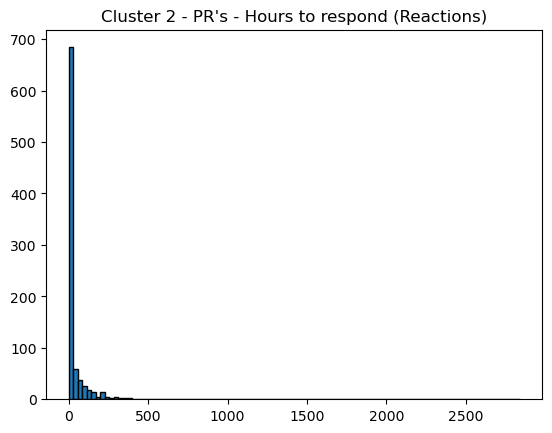

In [21]:
plt.hist(c2_train.pr_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s - Hours to respond (Reactions)')
plt.show()

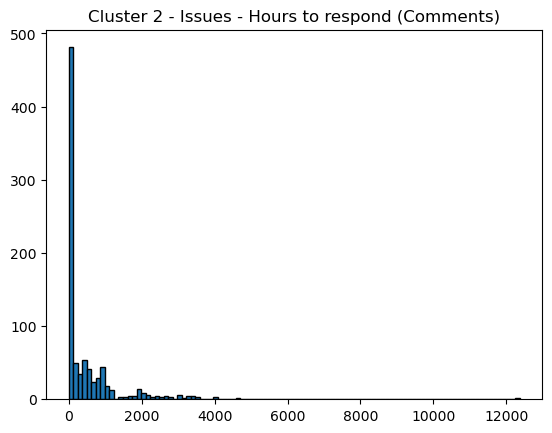

In [22]:
plt.hist(c2_train.issue_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues - Hours to respond (Comments)')
plt.show()

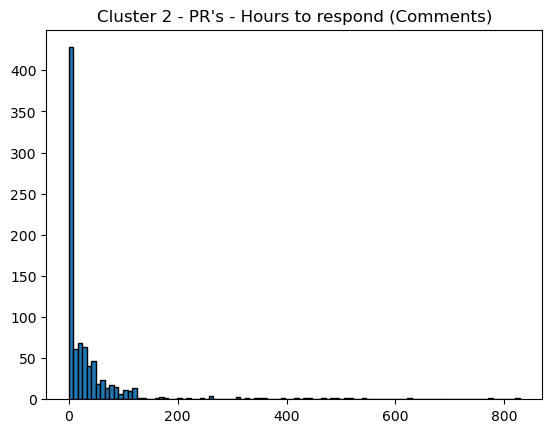

In [23]:
plt.hist(c2_train.pr_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s - Hours to respond (Comments)')
plt.show()

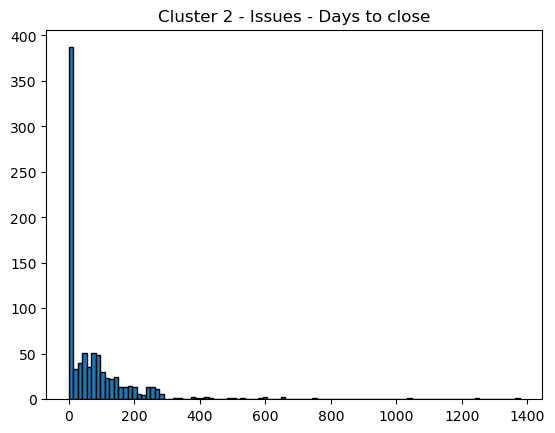

In [24]:
plt.hist(c2_train.days_to_close_issue, bins=100, edgecolor='black')
plt.title('Cluster 2 - Issues - Days to close')
plt.show()

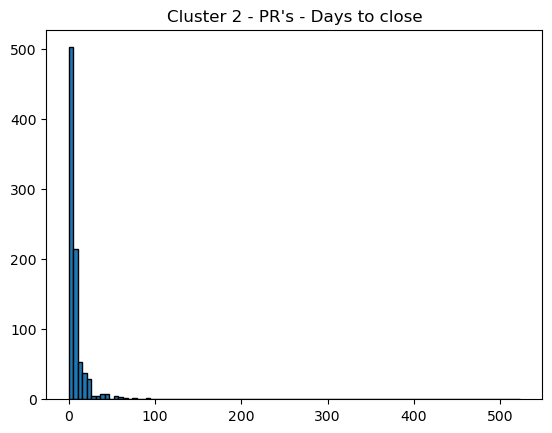

In [25]:
plt.hist(c2_train.days_to_close_pr, bins=100, edgecolor='black')
plt.title('Cluster 2 - PR\'s - Days to close')
plt.show()

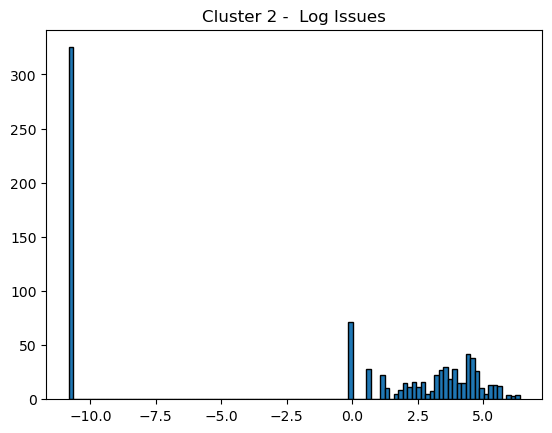

In [26]:
plt.hist(np.log(c2_train.issues + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 -  Log Issues')
plt.show()

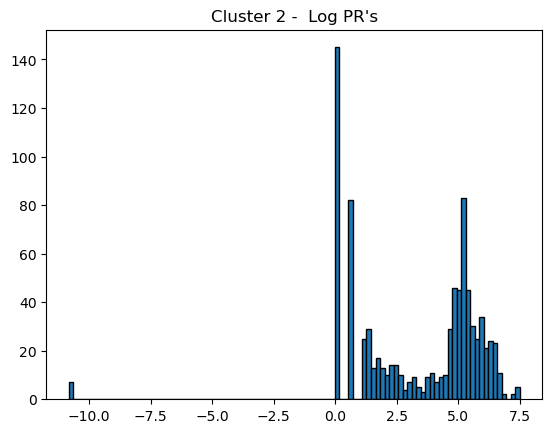

In [27]:
plt.hist(np.log(c2_train.prs + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 -  Log PR\'s')
plt.show()

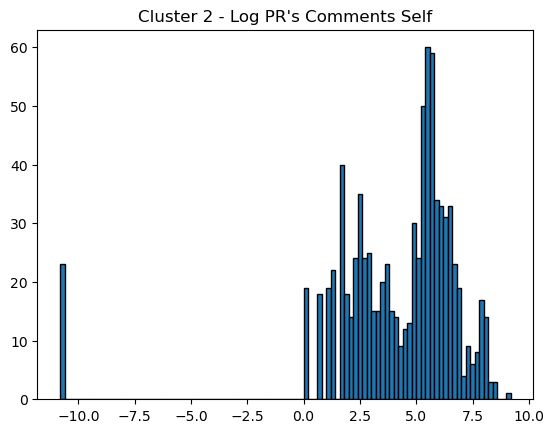

In [28]:
plt.hist(np.log(c2_train.pr_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s Comments Self')
plt.show()

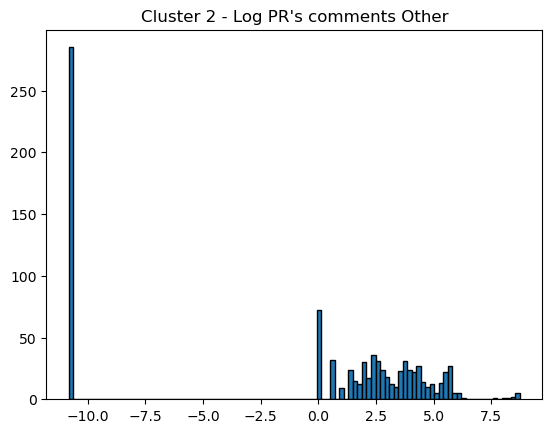

In [29]:
plt.hist(np.log(c2_train.pr_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s comments Other')
plt.show()

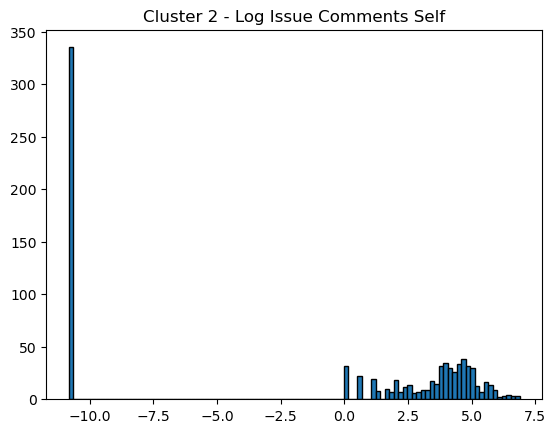

In [30]:
plt.hist(np.log(c2_train.issues_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issue Comments Self')
plt.show()

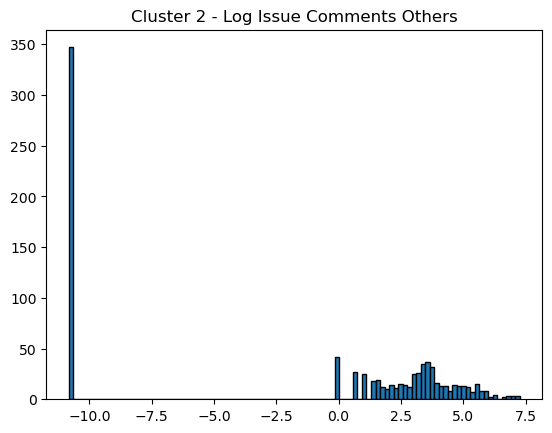

In [31]:
plt.hist(np.log(c2_train.issues_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issue Comments Others')
plt.show()

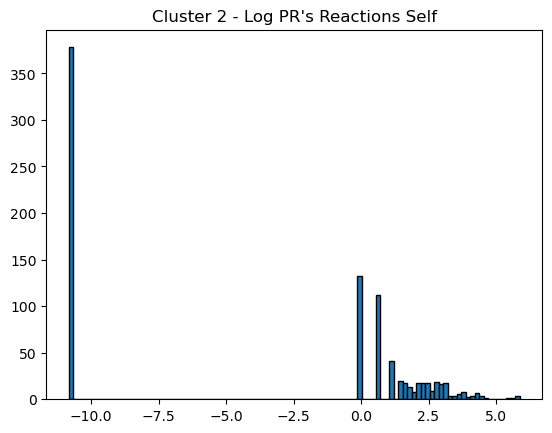

In [32]:
plt.hist(np.log(c2_train.pr_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s Reactions Self')
plt.show()

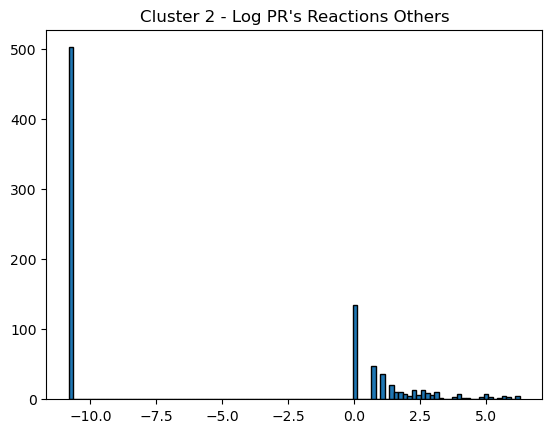

In [33]:
plt.hist(np.log(c2_train.pr_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s Reactions Others')
plt.show()

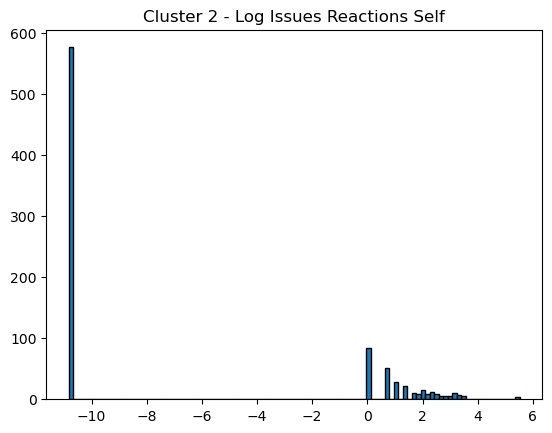

In [34]:
plt.hist(np.log(c2_train.issues_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issues Reactions Self')
plt.show()

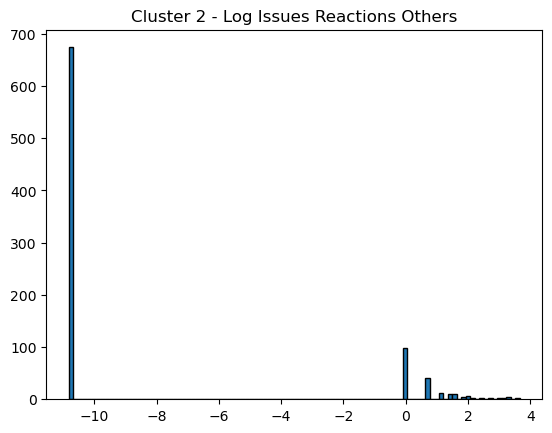

In [35]:
plt.hist(np.log(c2_train.issues_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issues Reactions Others')
plt.show()

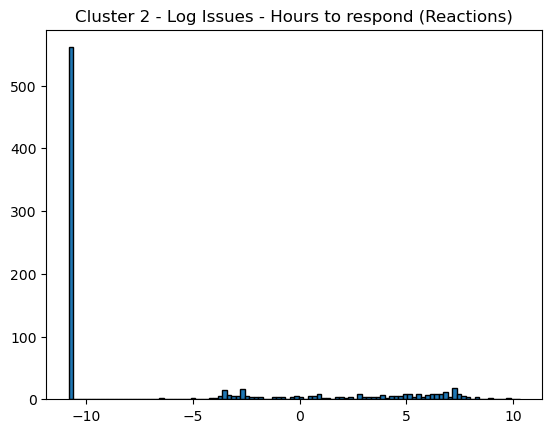

In [36]:
plt.hist(np.log(c2_train.issue_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issues - Hours to respond (Reactions)')
plt.show()

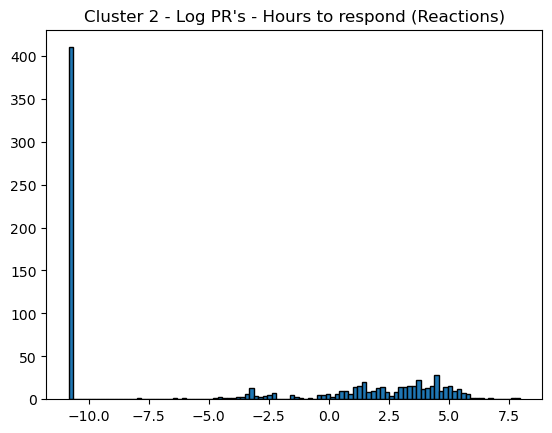

In [37]:
plt.hist(np.log(c2_train.pr_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s - Hours to respond (Reactions)')
plt.show()

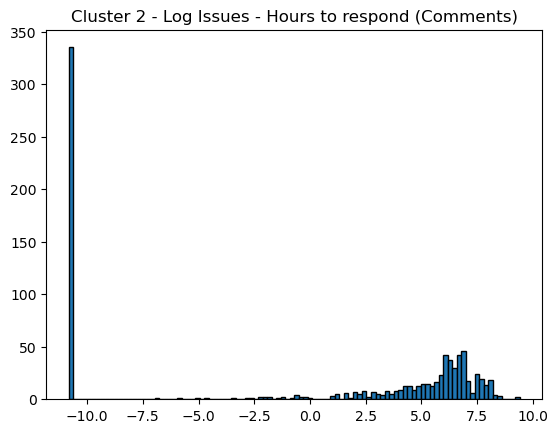

In [38]:
plt.hist(np.log(c2_train.issue_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issues - Hours to respond (Comments)')
plt.show()

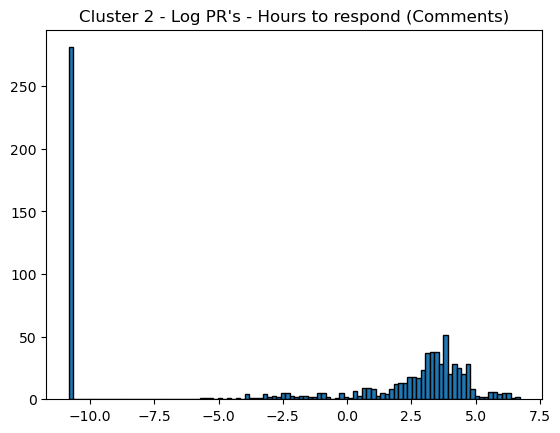

In [39]:
plt.hist(np.log(c2_train.pr_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s - Hours to respond (Comments)')
plt.show()

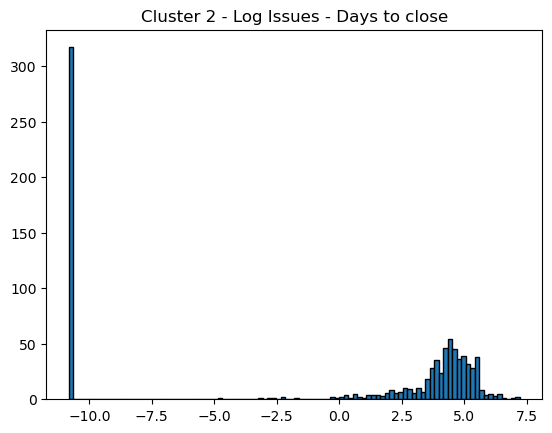

In [40]:
plt.hist(np.log(c2_train.days_to_close_issue + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log Issues - Days to close')
plt.show()

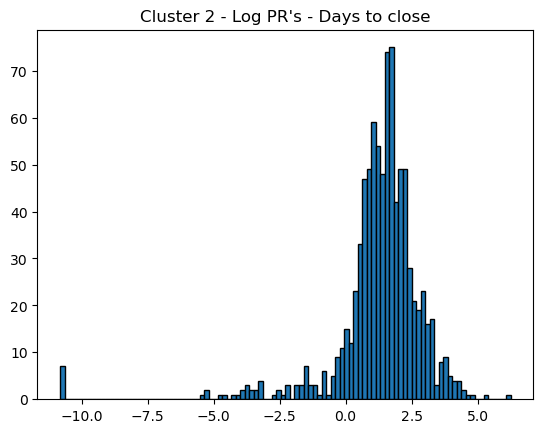

In [41]:
plt.hist(np.log(c2_train.days_to_close_pr + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 2 - Log PR\'s - Days to close')
plt.show()

In [42]:
c2_train.columns

Index(['issues', 'prs', 'pr_comments_self', 'pr_comments_others',
       'issues_comments_self', 'issues_comments_others', 'pr_reactions_self',
       'pr_reactions_others', 'issues_reactions_self',
       'issues_reactions_others', 'issue_hours_to_respond_reaction',
       'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment',
       'pr_hours_to_respond_comment', 'days_to_close_issue',
       'days_to_close_pr', 'is_core'],
      dtype='object')

In [43]:
c2_2 = c2_train.copy()
x = c2_2.drop(columns = 'is_core')
y = c2_2['is_core']


x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

scaler = StandardScaler()
X_std = scaler.fit_transform(x)
train = pd.DataFrame(X_std, columns=x.columns)  # Set the columns explicitly

# Reset index of the original DataFrame
c2_2.reset_index(drop=True, inplace=True)

# Concatenate X_std DataFrame with 'is_core' column
train = pd.concat([train, y], axis=1)
train



,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,-1.277253,-0.812853,-0.089998,-1.403314,-1.251584,0.350863,0.896333,-0.852622,-0.716774,1.656199,0.693667,-1.020688,-1.026906,-1.401708,-1.312870,0.698275,0
1,-1.277253,-0.965984,-0.422188,-1.403314,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-1.312870,0.435732,0
2,-1.277253,-0.619930,-0.001095,-1.403314,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-1.312870,1.018255,0
3,-1.277253,-0.704204,-0.583315,0.332635,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,0.609357,-1.312870,-0.056187,0
4,-1.277253,-0.492854,-0.467326,0.498286,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,0.122487,-1.312870,-0.990424,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,0.915522,0.901675,0.608716,0.901500,0.886004,1.021256,0.633242,-0.852622,1.263802,-0.547746,0.733829,-0.109304,1.291740,0.804928,0.789143,-0.214102,1
874,0.955881,1.059704,0.727953,0.866548,0.847330,1.034658,0.992418,0.905002,1.333554,-0.547746,-0.699857,0.658592,1.327423,0.890186,0.786714,-0.302371,1
875,0.463943,0.851436,0.615057,0.883089,0.460617,0.632329,0.633242,-0.852622,-0.716774,-0.547746,-0.699857,0.510195,1.324182,0.832858,0.796687,-0.219587,1
876,1.088056,1.236547,0.836816,0.829588,0.972710,1.160650,1.130925,1.083464,1.522548,-0.547746,-0.699857,0.791853,1.339595,0.945569,0.773040,-0.416753,1


In [44]:
x = X_test.copy()
x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

x2 = x.copy()
x2 = scaler.transform(x2)
test = pd.DataFrame(x2, columns=x.columns)
test = test.reset_index(drop=True)
x = x.reset_index(drop=True)
y_test = y_test.reset_index(drop = True)
test = pd.concat([test, y_test], axis = 1)
test

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.688991,0.312199,0.902505,-1.403314,0.420262,-1.214180,1.039445,1.467991,1.144562,1.656199,2.079074,1.322574,-1.102377,-1.401708,0.445162,0.133135,0
1,-1.277253,-0.965984,-0.929844,-1.403314,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-1.312870,-1.128061,0
2,-1.277253,-1.227762,-0.662586,-1.403314,-1.251584,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-1.312870,-3.387715,0
3,0.538571,0.146042,-0.154929,0.393772,0.679184,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,0.906903,0.679754,0.563413,0
4,0.303445,-1.227762,-4.689209,-1.403314,0.266157,-1.214180,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-0.147606,-0.994056,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,0.538571,0.056765,0.076943,0.687180,0.491918,0.610031,-1.135465,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-0.605833,0.699259,0.941218,0.423902,0
115,0.587727,0.417634,0.687631,0.498286,0.679184,0.927851,1.052530,1.421258,-0.716774,-0.547746,-0.699857,1.333343,0.279046,0.080536,0.958609,1.164751,0
116,0.941789,0.753881,0.433398,0.725074,0.894210,0.922392,0.992418,1.017599,1.144562,-0.547746,-0.699857,1.133652,0.890633,0.975082,0.771356,-0.220758,1
117,-1.277253,-1.227762,-0.662586,-1.403314,-1.251584,-1.214180,0.633242,-0.852622,-0.716774,-0.547746,-0.699857,-1.020688,-1.102377,-1.401708,-1.312870,-0.123545,0


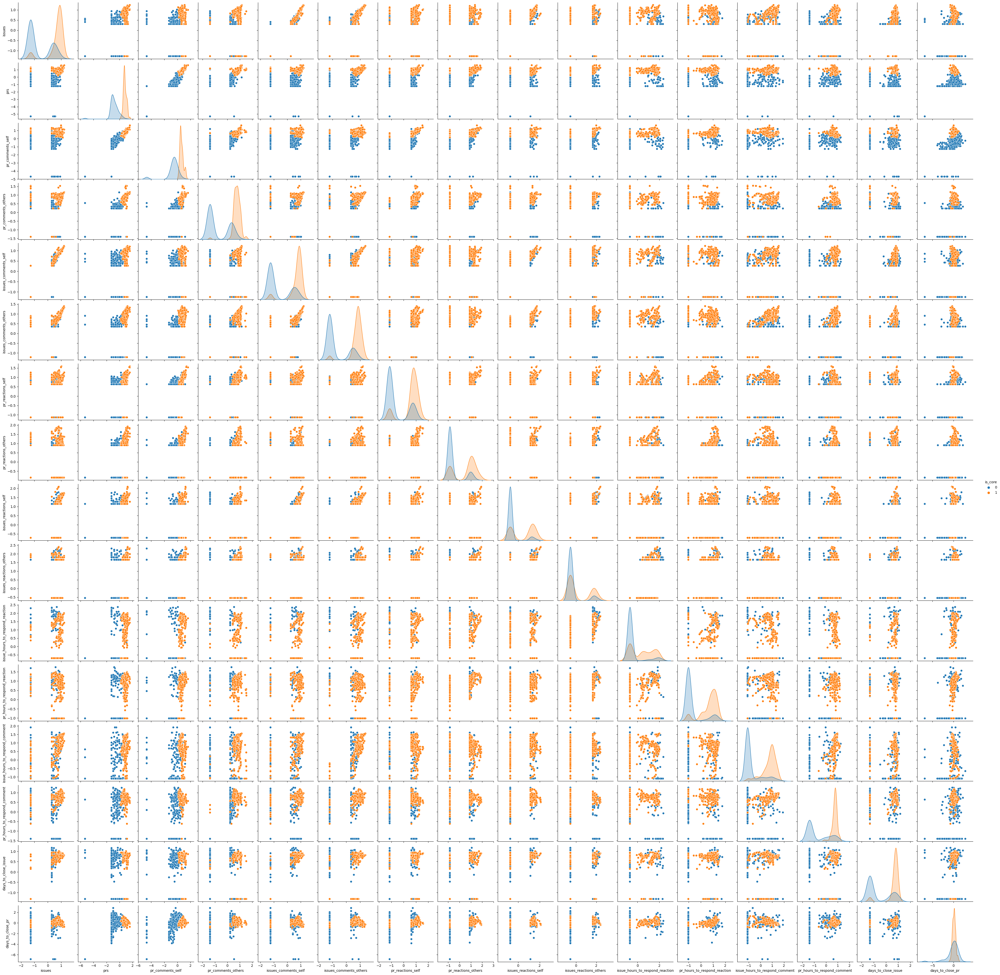

In [45]:
sns.pairplot(train, hue = 'is_core')

In [46]:
# Calculating mutual information for each feature
mi_scores2 = mutual_info_classif(X_std, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores2):
    print(f"{feature}: {score:.4f}")

issues: 0.3364
prs: 0.6062
pr_comments_self: 0.5324
pr_comments_others: 0.4654
issues_comments_self: 0.3345
issues_comments_others: 0.4335
pr_reactions_self: 0.2325
pr_reactions_others: 0.1555
issues_reactions_self: 0.1494
issues_reactions_others: 0.0458
issue_hours_to_respond_reaction: 0.1845
pr_hours_to_respond_reaction: 0.3174
issue_hours_to_respond_comment: 0.3867
pr_hours_to_respond_comment: 0.3706
days_to_close_issue: 0.3104
days_to_close_pr: 0.1370


In [47]:
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.3451
prs: 0.6044
pr_comments_self: 0.5360
pr_comments_others: 0.4703
issues_comments_self: 0.3174
issues_comments_others: 0.4295
pr_reactions_self: 0.2327
pr_reactions_others: 0.1808
issues_reactions_self: 0.1572
issues_reactions_others: 0.0686
issue_hours_to_respond_reaction: 0.1797
pr_hours_to_respond_reaction: 0.3176
issue_hours_to_respond_comment: 0.3860
pr_hours_to_respond_comment: 0.3649
days_to_close_issue: 0.3136
days_to_close_pr: 0.1367


In [48]:
for i in range(len(mi_scores)):
    print(X.columns[i], ":", round(mi_scores2[i] - mi_scores[i], 4))

issues : -0.0087
prs : 0.0018
pr_comments_self : -0.0035
pr_comments_others : -0.0049
issues_comments_self : 0.0171
issues_comments_others : 0.004
pr_reactions_self : -0.0002
pr_reactions_others : -0.0254
issues_reactions_self : -0.0078
issues_reactions_others : -0.0228
issue_hours_to_respond_reaction : 0.0048
pr_hours_to_respond_reaction : -0.0002
issue_hours_to_respond_comment : 0.0007
pr_hours_to_respond_comment : 0.0057
days_to_close_issue : -0.0033
days_to_close_pr : 0.0003


In [49]:
sorted_data = [x for _, x in sorted(zip(mi_scores2, X.columns), reverse=True)]
sorted_values = sorted(mi_scores2, reverse=True)

Text(0.5, 1.0, 'Mutual Information of Features')

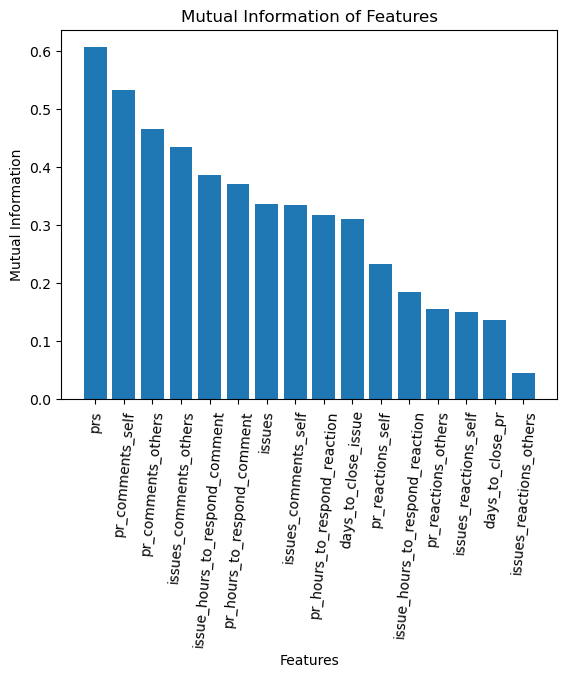

In [50]:
plt.bar(sorted_data, sorted_values)
plt.xticks(rotation=85) 
plt.xlabel('Features')
plt.ylabel('Mutual Information')
plt.title('Mutual Information of Features')

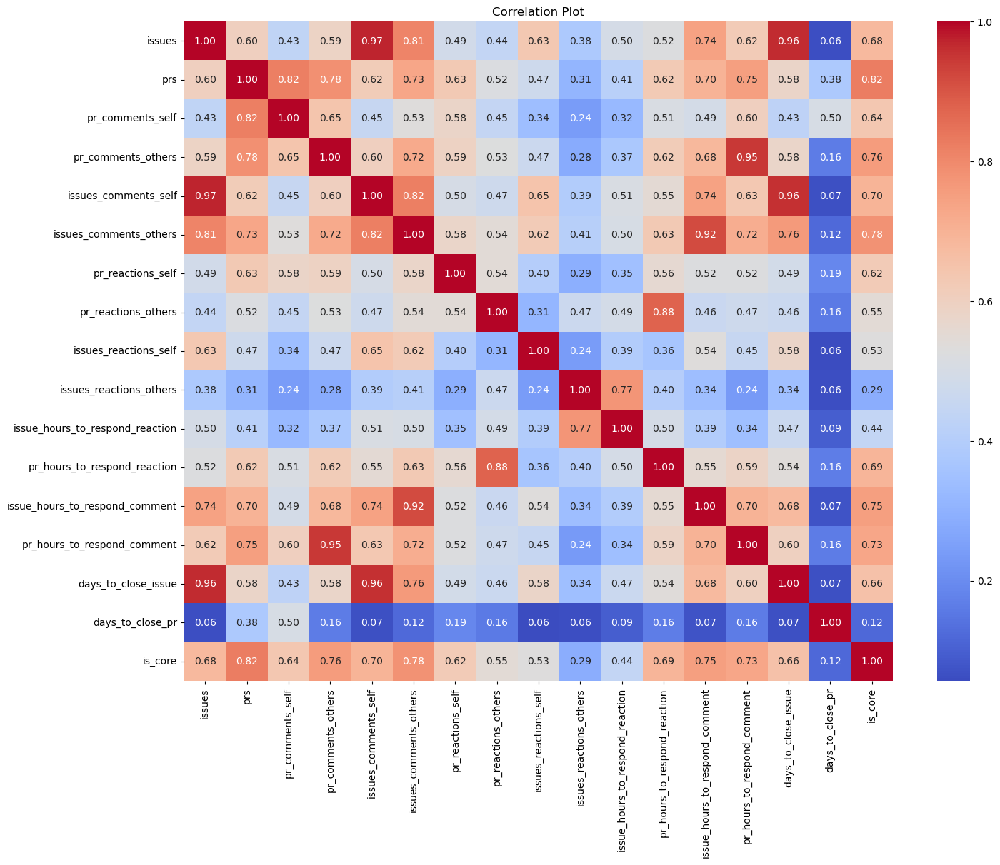

In [51]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [52]:
test['is_core'] = pd.Categorical(test['is_core'])
test['is_core'] = pd.Categorical(test['is_core'])

X_train = train.drop(columns = "is_core")
X_test = test.drop(columns = 'is_core')

y_train = train['is_core']
y_test = test['is_core']

X_train_filter = X_train.copy()
X_test_filter = X_test.copy()

X_train_filter = X_train_filter.drop(columns = ['days_to_close_pr', 'issues_reactions_others', 'issues', 
                                                'issues_comments_self', 'days_to_close_issue', 'pr_comments_self',
                                               'pr_hours_to_respond_comment', 'pr_reactions_others'])

X_test_filter = X_test_filter.drop(columns = ['days_to_close_pr', 'issues_reactions_others', 'issues', 
                                                'issues_comments_self', 'days_to_close_issue', 'pr_comments_self',
                                               'pr_hours_to_respond_comment', 'pr_reactions_others'])

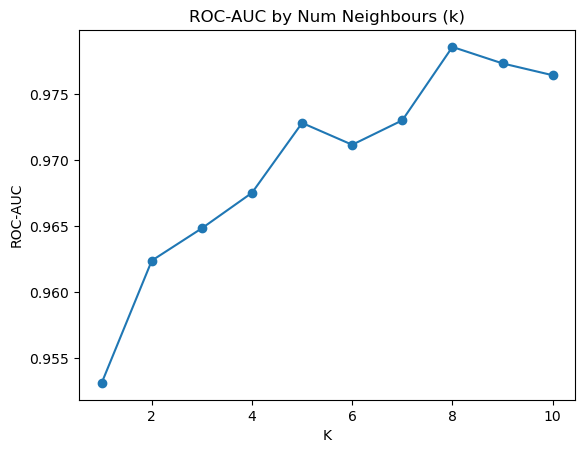

In [53]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [54]:
max_k = scores.index(max(scores))+1
knn_classifier_final = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_final.fit(X_train, y_train)


y_pred = knn_classifier_final.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[101  10]
 [  0   8]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95       111
           1       0.44      1.00      0.62         8

    accuracy                           0.92       119
   macro avg       0.72      0.95      0.78       119
weighted avg       0.96      0.92      0.93       119



In [55]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model = rf_grid_search.best_estimator_
y_pred = rf_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 0.63 Minutes

Best Hyperparameters: {'max_depth': 5, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[107   4]
 [  0   8]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       111
           1       0.67      1.00      0.80         8

    accuracy                           0.97       119
   macro avg       0.83      0.98      0.89       119
weighted avg       0.98      0.97      0.97       119



In [56]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model = dt_grid_search.best_estimator_
y_pred = dt_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.01 Minutes

Best Hyperparameters: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[107   4]
 [  0   8]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       111
           1       0.67      1.00      0.80         8

    accuracy                           0.97       119
   macro avg       0.83      0.98      0.89       119
weighted avg       0.98      0.97      0.97       119



In [57]:
y_pred = dt_best_model.predict(X_train)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[430  10]
 [  0 438]]

Test Set Accuracy: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       440
           1       0.98      1.00      0.99       438

    accuracy                           0.99       878
   macro avg       0.99      0.99      0.99       878
weighted avg       0.99      0.99      0.99       878



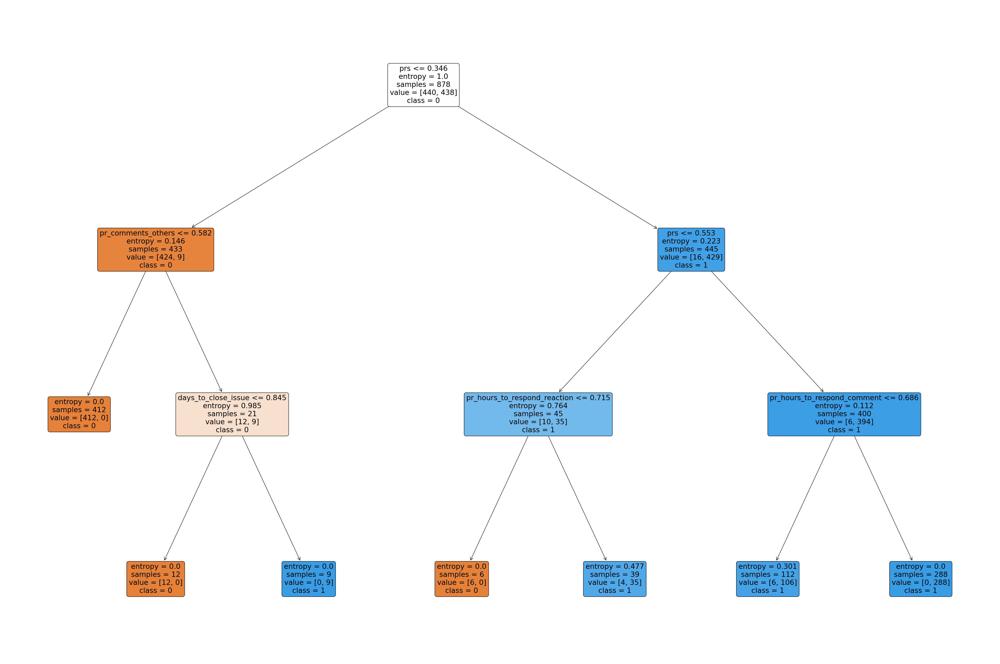

In [58]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [59]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model = xg_grid_search.best_estimator_
y_pred = xg_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 1.01 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}
Best Cross-Validation Accuracy: 1.00
Confusion Matrix:
[[110   1]
 [  0   8]]

Test Set Accuracy: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       111
           1       0.89      1.00      0.94         8

    accuracy                           0.99       119
   macro avg       0.94      1.00      0.97       119
weighted avg       0.99      0.99      0.99       119



In [60]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [61]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model = log_grid_search.best_estimator_
y_pred = log_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 10, 'l1_ratio': 0.1, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[106   5]
 [  0   8]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.98       111
           1       0.62      1.00      0.76         8

    accuracy                           0.96       119
   macro avg       0.81      0.98      0.87       119
weighted avg       0.97      0.96      0.96       119



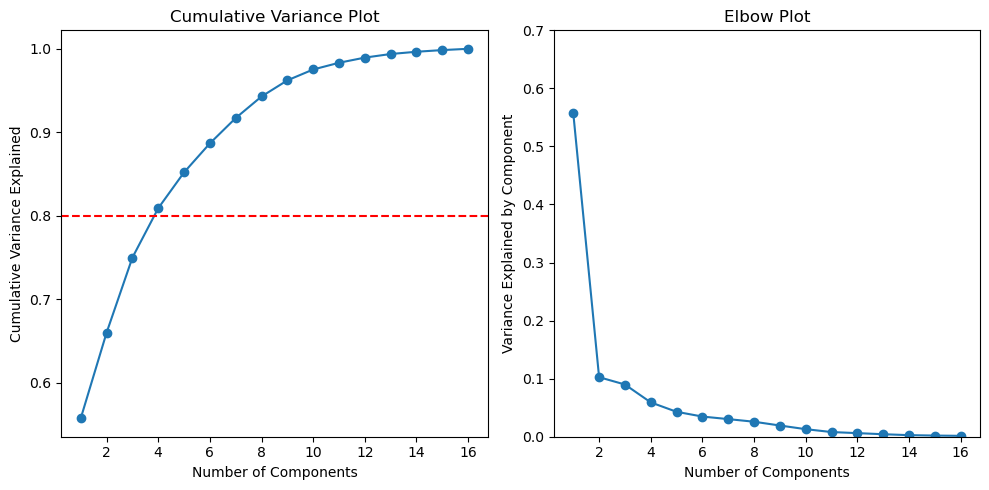

In [62]:
# Fit PCA and transform the standardized data
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

# Elbow plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.title('Cumulative Variance Plot')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.axhline(y=0.8, color='red', linestyle='--')

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Elbow Plot')
plt.xlabel('Number of Components')
plt.ylabel('Variance Explained by Component')
plt.ylim(0, 0.7)  
plt.tight_layout()

plt.show()

In [63]:
pca = PCA(n_components=4)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

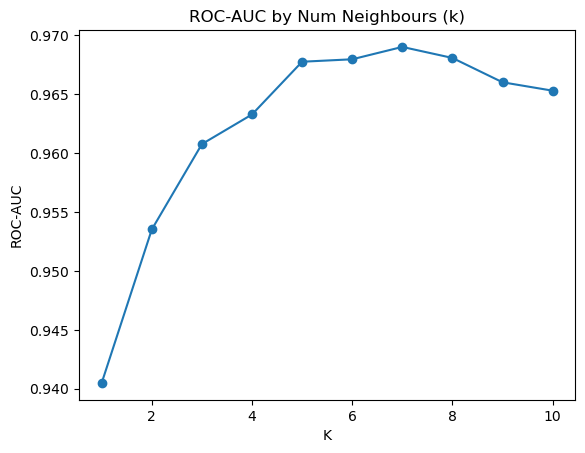

In [64]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_pca, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))

plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()    

In [65]:
max_k = scores.index(max(scores))+1
knn_classifier_pca = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_pca.fit(X_train_pca, y_train)


y_pred = knn_classifier_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[102   9]
 [  0   8]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       111
           1       0.47      1.00      0.64         8

    accuracy                           0.92       119
   macro avg       0.74      0.96      0.80       119
weighted avg       0.96      0.92      0.94       119



In [66]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_pca = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_pca = rf_grid_search_pca.best_estimator_
y_pred = rf_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 0.58 Minutes

Best Hyperparameters: {'max_depth': 10, 'max_samples': 0.6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[104   7]
 [  0   8]]

Test Set Accuracy: 0.94

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       111
           1       0.53      1.00      0.70         8

    accuracy                           0.94       119
   macro avg       0.77      0.97      0.83       119
weighted avg       0.97      0.94      0.95       119



In [67]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_pca = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_pca = dt_grid_search_pca.best_estimator_
y_pred = dt_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.0 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 25}
Best Cross-Validation Accuracy: 0.96
Confusion Matrix:
[[104   7]
 [  0   8]]

Test Set Accuracy: 0.94

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       111
           1       0.53      1.00      0.70         8

    accuracy                           0.94       119
   macro avg       0.77      0.97      0.83       119
weighted avg       0.97      0.94      0.95       119



In [68]:
y_pred = dt_best_model_pca.predict(X_train_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[427  13]
 [ 20 418]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       440
           1       0.97      0.95      0.96       438

    accuracy                           0.96       878
   macro avg       0.96      0.96      0.96       878
weighted avg       0.96      0.96      0.96       878



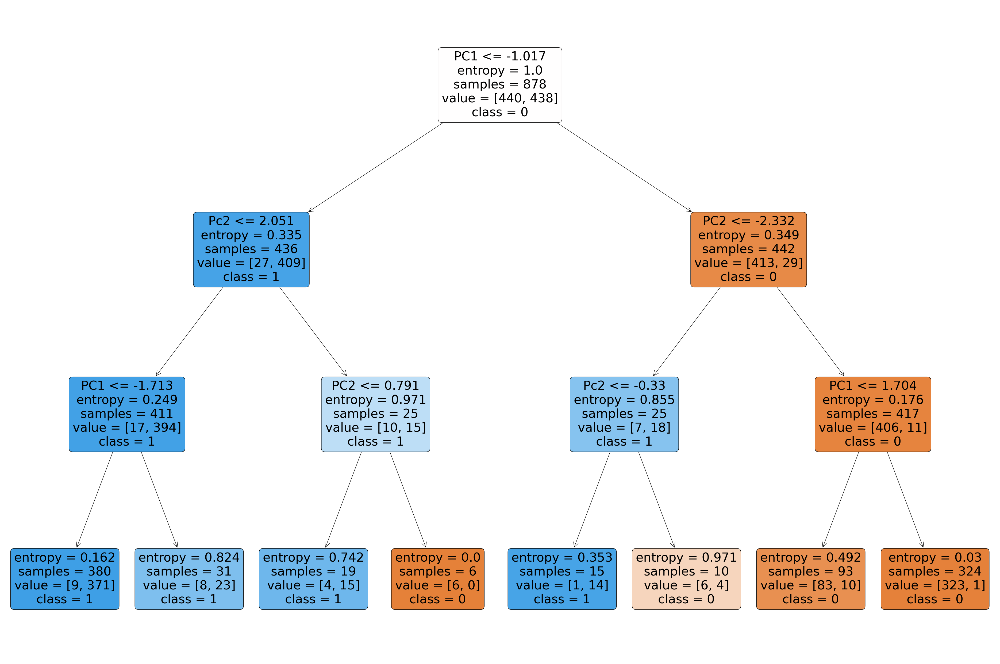

In [69]:
cols = ['PC1', 'PC2', 'Pc2', 'PC4']
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_pca, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = cols, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [70]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_pca = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_pca = xg_grid_search_pca.best_estimator_
y_pred = xg_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 0.76 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[102   9]
 [  0   8]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       111
           1       0.47      1.00      0.64         8

    accuracy                           0.92       119
   macro avg       0.74      0.96      0.80       119
weighted avg       0.96      0.92      0.94       119



In [71]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_pca = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


In [72]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_pca = log_grid_search_pca.best_estimator_
y_pred = log_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.1, 'l1_ratio': 0.1, 'penalty': 'l2'}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[102   9]
 [  0   8]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       111
           1       0.47      1.00      0.64         8

    accuracy                           0.92       119
   macro avg       0.74      0.96      0.80       119
weighted avg       0.96      0.92      0.94       119



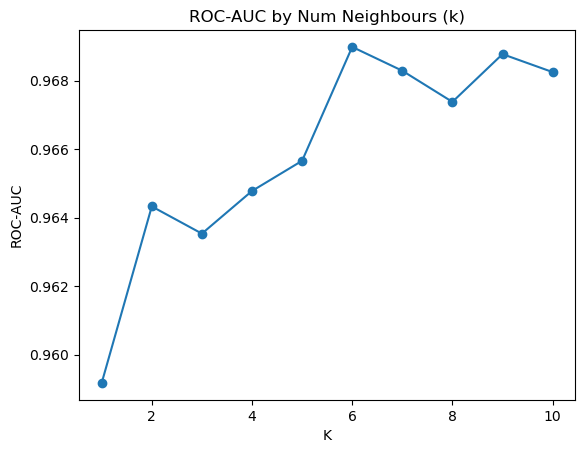

In [73]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_filter, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [74]:
max_k = scores.index(max(scores))+1
knn_classifier_filter = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_filter.fit(X_train_filter, y_train)


y_pred = knn_classifier_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[104   7]
 [  0   8]]

Test Set Accuracy: 0.94

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       111
           1       0.53      1.00      0.70         8

    accuracy                           0.94       119
   macro avg       0.77      0.97      0.83       119
weighted avg       0.97      0.94      0.95       119



In [75]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_filter = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_filter = rf_grid_search_filter.best_estimator_
y_pred = rf_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 0.52 Minutes

Best Hyperparameters: {'max_depth': 5, 'max_samples': 0.5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[105   6]
 [  0   8]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97       111
           1       0.57      1.00      0.73         8

    accuracy                           0.95       119
   macro avg       0.79      0.97      0.85       119
weighted avg       0.97      0.95      0.96       119



In [76]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_filter = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_filter = dt_grid_search_filter.best_estimator_
y_pred = dt_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.01 Minutes

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 25}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[107   4]
 [  0   8]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98       111
           1       0.67      1.00      0.80         8

    accuracy                           0.97       119
   macro avg       0.83      0.98      0.89       119
weighted avg       0.98      0.97      0.97       119



In [77]:
y_pred = dt_best_model_filter.predict(X_train_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[430  10]
 [ 13 425]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       440
           1       0.98      0.97      0.97       438

    accuracy                           0.97       878
   macro avg       0.97      0.97      0.97       878
weighted avg       0.97      0.97      0.97       878



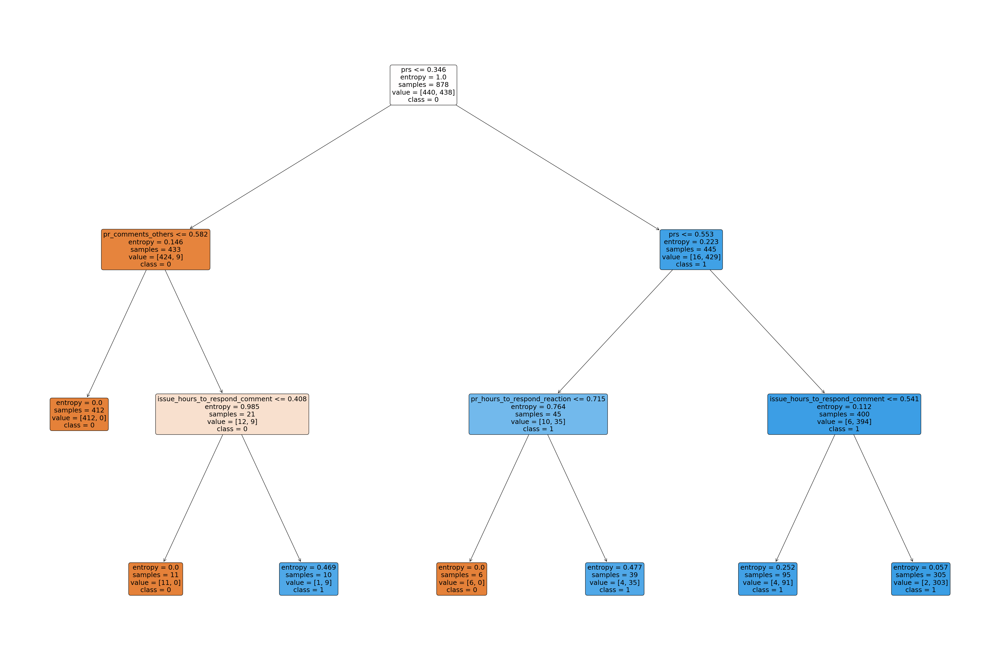

In [78]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_filter, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train_filter.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [79]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_filter = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_filter = xg_grid_search_filter.best_estimator_
y_pred = xg_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 0.59 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[109   2]
 [  0   8]]

Test Set Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       111
           1       0.80      1.00      0.89         8

    accuracy                           0.98       119
   macro avg       0.90      0.99      0.94       119
weighted avg       0.99      0.98      0.98       119



In [80]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_filter = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


In [81]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_filter = log_grid_search_filter.best_estimator_
y_pred = log_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0.1, 'penalty': 'l1'}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[100  11]
 [  0   8]]

Test Set Accuracy: 0.91

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.90      0.95       111
           1       0.42      1.00      0.59         8

    accuracy                           0.91       119
   macro avg       0.71      0.95      0.77       119
weighted avg       0.96      0.91      0.92       119



In [82]:
std_models = [knn_classifier_final, rf_best_model, dt_best_model, xg_best_model, log_best_model]
pca_models = [knn_classifier_pca, rf_best_model_pca, dt_best_model_pca, xg_best_model_pca, log_best_model_pca]
filter_models = [knn_classifier_filter, rf_best_model_filter, dt_best_model_filter, xg_best_model_filter, log_best_model_filter]

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


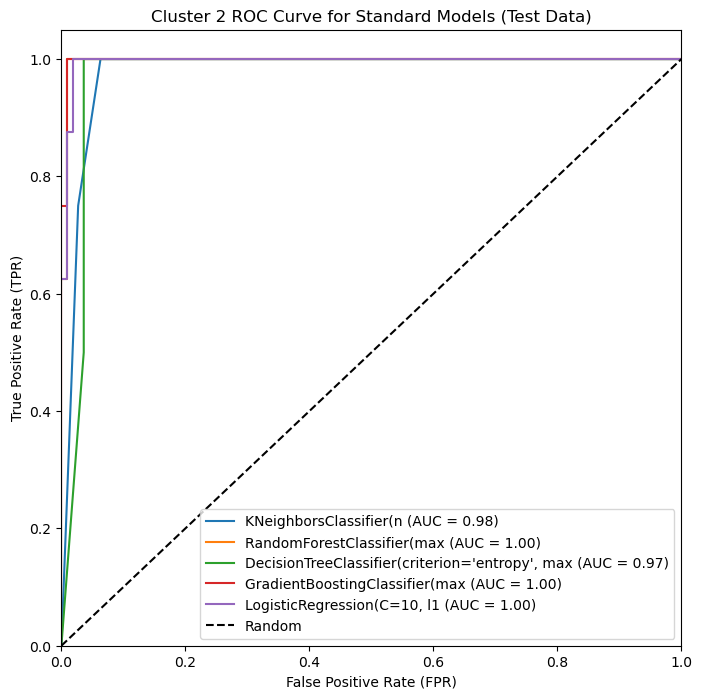

In [83]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 2 ROC Curve for Standard Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


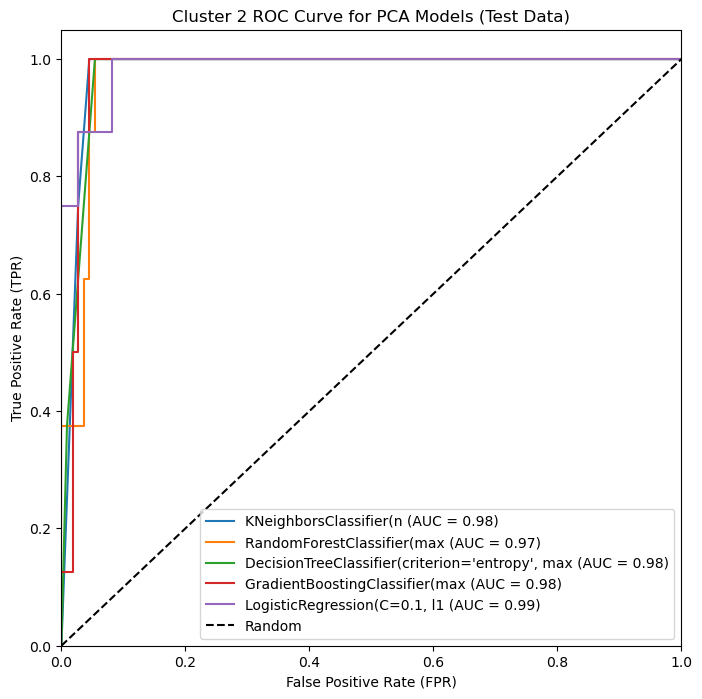

In [84]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 2 ROC Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


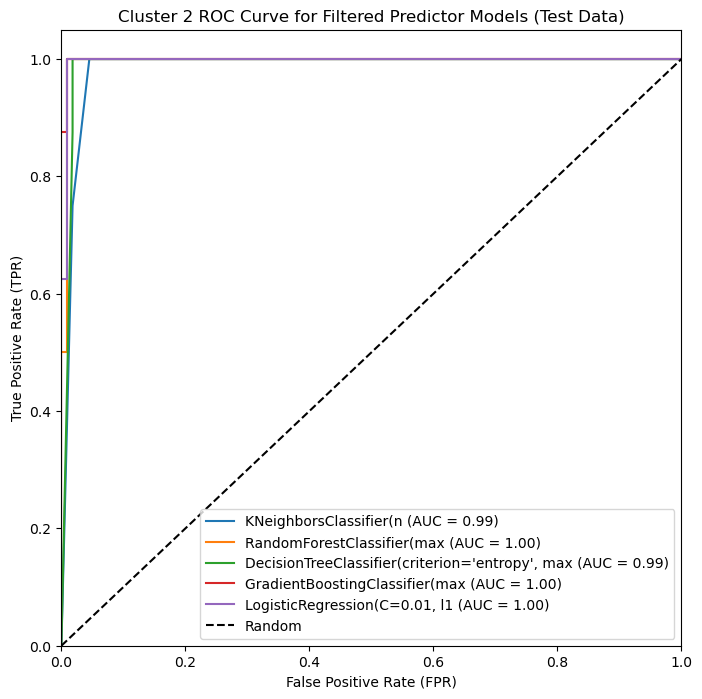

In [85]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 2 ROC Curve for Filtered Predictor Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


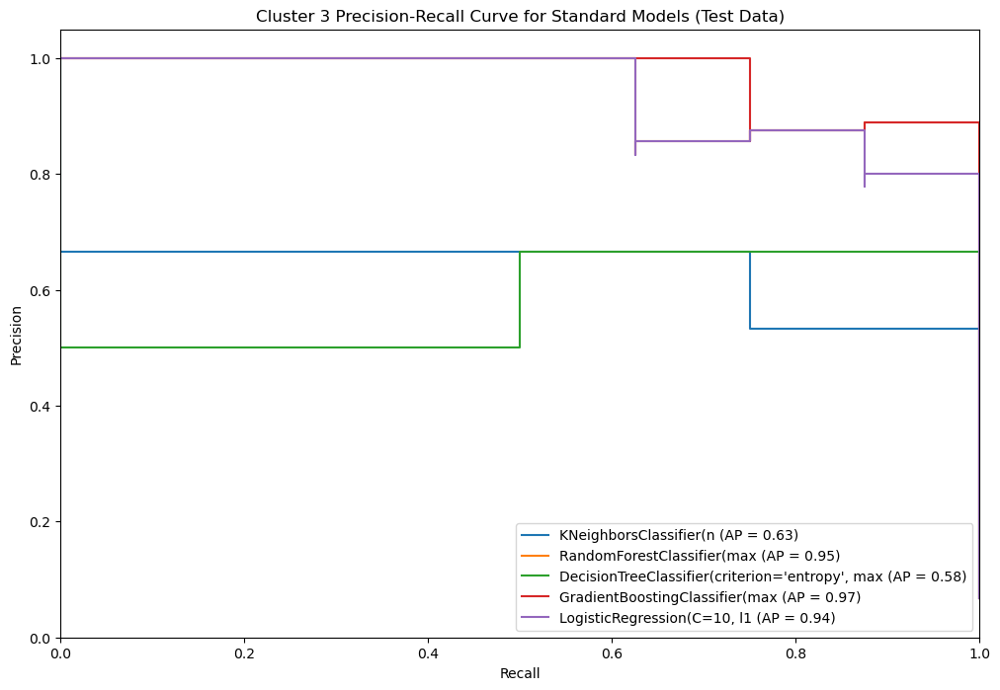

In [86]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 3 Precision-Recall Curve for Standard Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


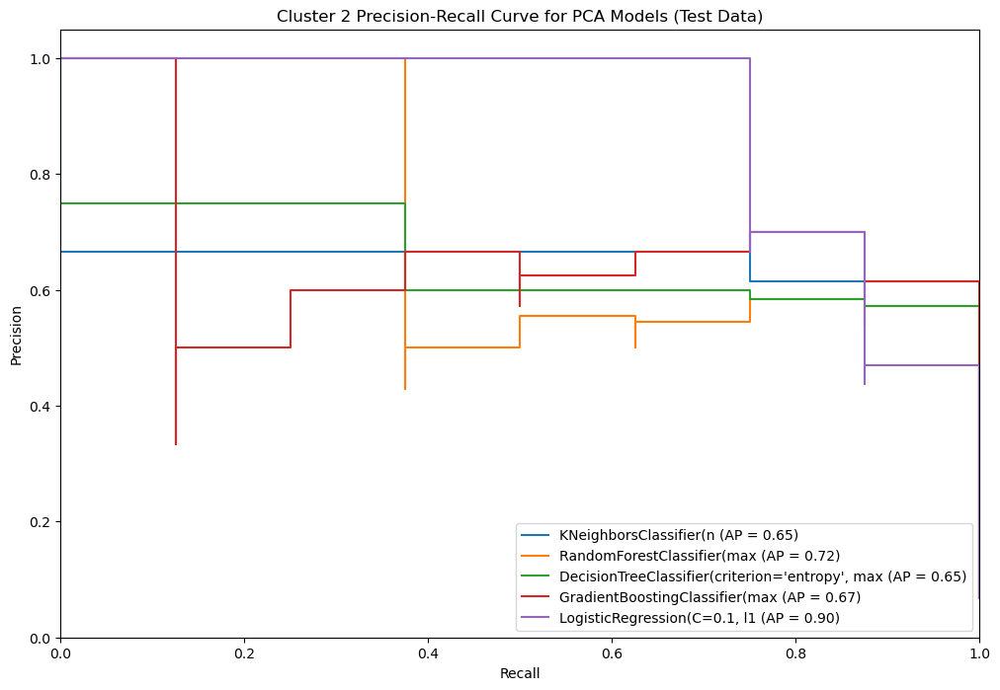

In [87]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 2 Precision-Recall Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


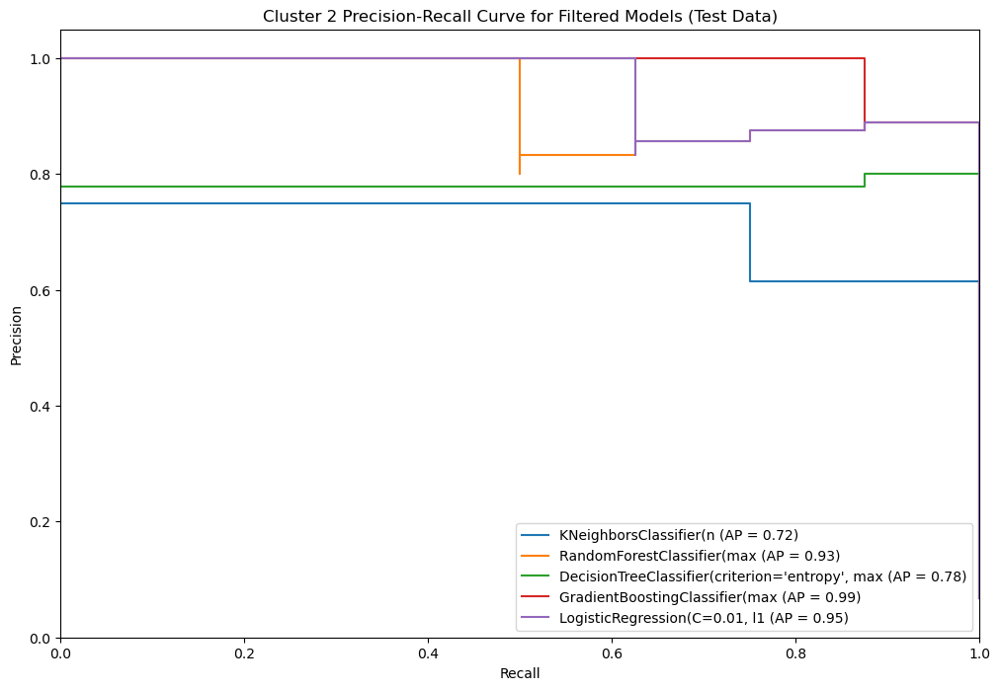

In [88]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 2 Precision-Recall Curve for Filtered Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


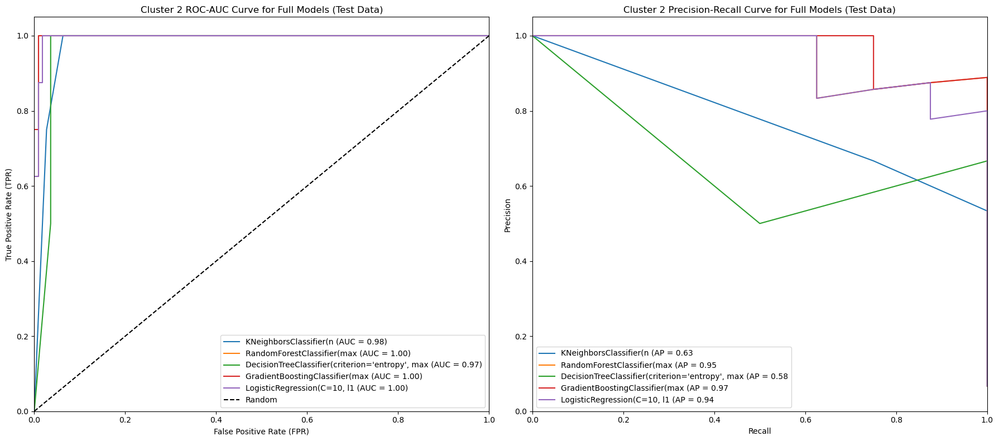

In [89]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 2 ROC-AUC Curve for Full Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 2 Precision-Recall Curve for Full Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


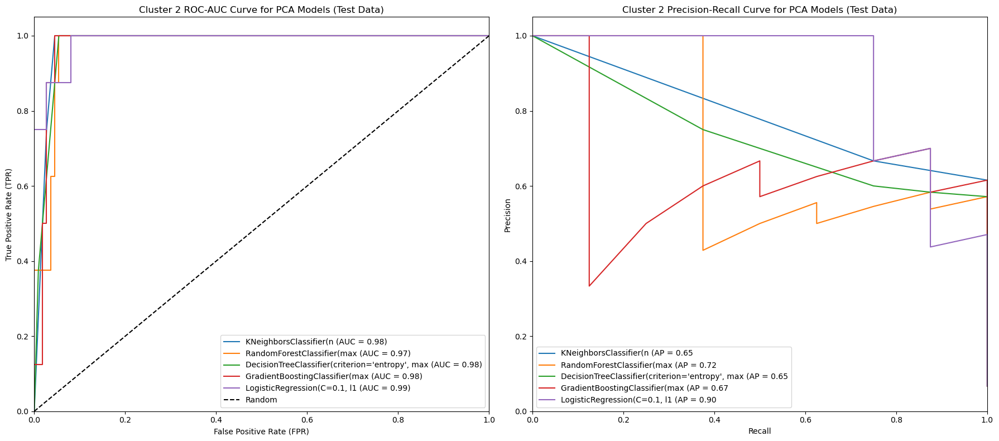

In [90]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 2 ROC-AUC Curve for PCA Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 2 Precision-Recall Curve for PCA Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


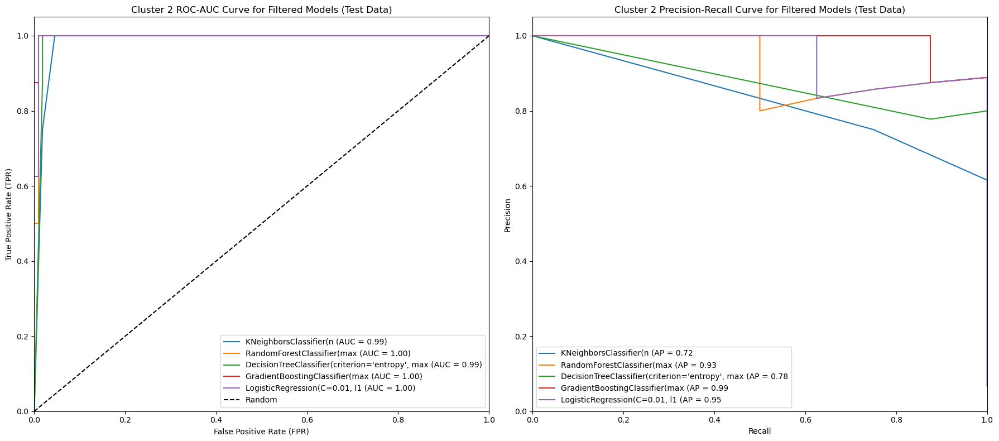

In [91]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 2 ROC-AUC Curve for Filtered Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 2 Precision-Recall Curve for Filtered Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()
